# Notebook for demonstrating H2Matrices.jl features and usage

In [1]:
using H2Matrices
using HMatrices: KernelMatrix, ClusterTree, GeometricSplitter, assemble_hmatrix, compression_ratio
using StaticArrays, LinearAlgebra

using Plots

## generating example matrix

For the purpose of illustration, let us consider an abstract matrix K with entry i,j given by the evaluation of some kernel function G on points X[i] and Y[j], where X and Y are vector of points (in 3D here); that is, K[i,j]=G(X[i],Y[j]). This object can be constructed as follows:

In [2]:
const Point3D = SVector{3,Float64}
# sample some points on a sphere
m = 500_00
X = Y = [Point3D(sin(θ)cos(ϕ),sin(θ)*sin(ϕ),cos(θ)) for (θ,ϕ) in zip(π*rand(m),2π*rand(m))]
function G(x,y)
  d = norm(x-y) + 1e-8
  1/(4π*d)
end
K = KernelMatrix(G,X,Y)

50000×50000 KernelMatrix{typeof(G), Vector{SVector{3, Float64}}, Vector{SVector{3, Float64}}, Float64}:
 7.95775e6  0.0551333  0.0414651  …  0.0529963  0.0531266  0.0459552
 0.0551333  7.95775e6  0.0458731     0.181036   0.106247   0.167012
 0.0414651  0.0458731  7.95775e6     0.0479376  0.049647   0.0549699
 0.115284   0.0768304  0.0407331     0.0815154  0.0555686  0.057736
 0.0461319  0.0424796  0.136073      0.0419059  0.050955   0.0470654
 0.0487663  0.267944   0.0507287  …  0.181208   0.101379   0.425528
 0.0487864  0.0467398  0.081845      0.0429135  0.0660759  0.050562
 0.0512144  0.0560665  0.0622977     0.0740292  0.0436806  0.0590456
 0.0770186  0.101522   0.0422146     0.126157   0.0590601  0.0718117
 0.0477179  0.220767   0.0520661     0.173175   0.0987615  0.622859
 ⋮                                ⋱                        
 0.0407349  0.0691135  0.0892034     0.0655153  0.0817416  0.104914
 0.0413779  0.0848138  0.0746154     0.0893463  0.0752238  0.161749
 0.0722216  0.0

## compression with HMatrices.jl

In [3]:
H = assemble_hmatrix(K; atol=1e-6)

# Print compression summary for H-matrix
H_uncompressed = length(H) * sizeof(eltype(H))
H_compressed   = Base.summarysize(H)
H_ratio        = H_uncompressed / H_compressed
_human(b) = b < 1024 ? "$(b) B" : b < 1024^2 ? "$(round(b/1024; digits=1)) KB" : "$(round(b/1024^2; digits=1)) MB"
println("H-matrix:  $(_human(H_uncompressed)) → $(_human(H_compressed))  (ratio: $(round(H_ratio; digits=2))×)")


H-matrix:  19073.5 MB → 1320.3 MB  (ratio: 14.45×)


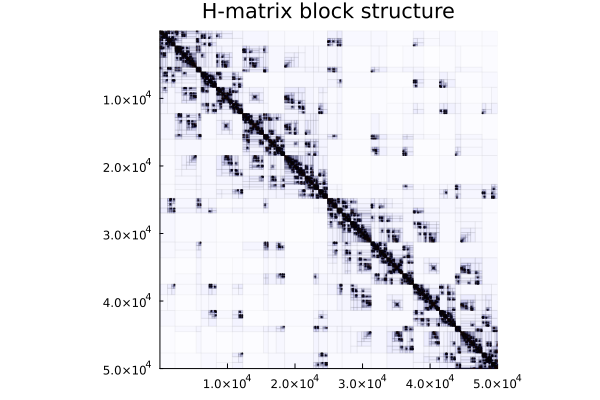

In [4]:
plot(H; title="H-matrix block structure")


### checking approximation

In [5]:
x = rand(m)
y = H*x

y[42] - sum(K[42,j]*x[j] for j in 1:m) # expected to be about 2e-7
println("HMatrix approximation absolute error at index 42: $(y[42] - sum(K[42,j]*x[j] for j in 1:m))")
println("HMatrix approximation relative error at index 42: $(abs(y[42] - sum(K[42,j]*x[j] for j in 1:m)) / abs(sum(K[42,j]*x[j] for j in 1:m)))")

HMatrix approximation absolute error at index 42: 9.434297680854797e-7
HMatrix approximation relative error at index 42: 1.9570719702879668e-13


## compression with H2Matrices.jl

In [6]:
# Assemble an H²-matrix using Chebyshev interpolation
h2 = assemble_h2matrix(K; order=4)

# Compare the two (use Base.summarysize for both for a fair apples-to-apples comparison)
h2_compressed = Base.summarysize(h2)
h2_ratio = H_uncompressed / h2_compressed
println()
println("┌─────────────────────────────────────────────────────┐")
println("│           H-matrix vs H²-matrix Comparison          │")
println("├──────────────┬──────────────┬────────────────────────┤")
println("│              │  Compressed  │  Compression Ratio     │")
println("├──────────────┼──────────────┼────────────────────────┤")
println("│  H-matrix    │  $(lpad(_human(H_compressed), 9))  │  $(lpad(round(H_ratio; digits=2), 8))×            │")
println("│  H²-matrix   │  $(lpad(_human(h2_compressed), 9))  │  $(lpad(round(h2_ratio; digits=2), 8))×            │")
println("├──────────────┼──────────────┼────────────────────────┤")
println("│  Uncompressed│  $(lpad(_human(H_uncompressed), 9))  │                        │")
println("└──────────────┴──────────────┴────────────────────────┘")


┌ Info: H²-matrix assembled
│   size = 50000 × 50000
│   uncompressed = 18.63 GB
│   compressed = 834.5 MB
│   ratio = 22.86
└ @ H2Matrices /Users/yimingzhang/Github/H2Matrices.jl/src/h2matrix.jl:337



┌─────────────────────────────────────────────────────┐
│           H-matrix vs H²-matrix Comparison          │
├──────────────┬──────────────┬────────────────────────┤
│              │  Compressed  │  Compression Ratio     │
├──────────────┼──────────────┼────────────────────────┤
│  H-matrix    │  1320.3 MB  │     14.45×            │
│  H²-matrix   │  1076.2 MB  │     17.72×            │
├──────────────┼──────────────┼────────────────────────┤
│  Uncompressed│  19073.5 MB  │                        │
└──────────────┴──────────────┴────────────────────────┘


### checking approximation

In [7]:
y2 = h2*x

y2[42] - sum(K[42,j]*x[j] for j in 1:m) 

println("H²-matrix approximation absolute error at index 42: $(y2[42] - sum(K[42,j]*x[j] for j in 1:m))")
println("H²-matrix approximation relative error at index 42: $(abs(y2[42] - sum(K[42,j]*x[j] for j in 1:m)) / abs(sum(K[42,j]*x[j] for j in 1:m)))")


H²-matrix approximation absolute error at index 42: 0.1557645695284009
H²-matrix approximation relative error at index 42: 3.231215330491715e-8


## compressed matrix graphs

In [10]:
plot(
    plot(H;  title="H-matrix", dpi=300),
    plot(h2; title="H²-matrix", dpi=300);
    layout=(1,2), size=(1000, 450)
)

# save out the H-matrix and H²-matrix block structure side by side plots
# specify dpi for better resolution
savefig("../docs/src/assets/h_and_h2_matrix_block_structures.png")

# show the plots
# display(plot(
#     plot(H;  title="H-matrix", dpi=300),
#     plot(h2; title="H²-matrix", dpi=300);
#     layout=(1,2), size=(1000, 450)
# ))


"/Users/yimingzhang/Github/H2Matrices.jl/docs/src/assets/h_and_h2_matrix_block_structures.png"